Visualize EV results - average of 40 runs, time since wind change

## load data
based on JH_model_fitting.py

In [12]:
import os
import sys
import numpy as np

# eval_pkl = '/src/data/wind_sensing/apparent_wind_visual_feedback/sw_dist_logstep_wind_0.001_debug_yes_vec_norm_train_actor_std/eval/plume_14421_37e2cd4be4c96943d0341849b40f81eb/noisy3x5b5_more_offsets.pkl'
# eval_pkl = '/src/data/wind_sensing/apparent_wind_visual_feedback/sw_dist_logstep_wind_0.001_debug_yes_vec_norm_train_actor_std/eval/plume_14421_37e2cd4be4c96943d0341849b40f81eb/noisy3x5b5_original_inits.pkl'
# eval_pkl = '/src/data/wind_sensing/apparent_wind_visual_feedback/sw_dist_logstep_wind_0.001_debug_yes_vec_norm_train_actor_std/eval/plume_14421_37e2cd4be4c96943d0341849b40f81eb/poisson_noisy3x5b5.pkl'

poisson_agents = ['plume_30011_9beecb563ff6757746898c0b75f0d7e7/poisson_noisy3x5b5.pkl',
'plume_21943_e03b9588604c41ee7292e64a5274bfc0/poisson_noisy3x5b5.pkl',
'plume_24835_5216f9b29f4bc2d9496619e9d2132553/poisson_noisy3x5b5.pkl',
'plume_11848_abc2d820be42ae13fbdd73e28e3a04a4/poisson_noisy3x5b5.pkl']
poisson_agent_folder = '/src/data/wind_sensing/apparent_wind_visual_feedback/sw_dist_logstep_wind_0.01_train_std_pois_wind/eval'
tmp = []
for agent in poisson_agents:
    agent = os.path.join(poisson_agent_folder, agent)
    tmp.append(agent)
poisson_agents = tmp

eval_pkl = poisson_agents[1]

obs_pkl = eval_pkl.replace(".pkl", "_observability_test.pkl")
eval_folder = os.path.dirname(eval_pkl) + '/'
dataset = os.path.basename(eval_pkl).replace('.pkl', '')

model_name = os.path.basename(os.path.dirname(eval_folder)).split('_')[1]
print(f"now visualizing {model_name}, {dataset}")
# check if obs file exists
if not os.path.exists(obs_pkl):
    print(f"Observability file {obs_pkl} not found")


now visualizing 21943, poisson_noisy3x5b5


In [13]:
# load pkl file
import pickle
import seaborn as sns
import pandas as pd
import numpy as np
import tamagotchi.eval.log_analysis as log_analysis

# with open(obs_pkls[0], 'rb') as f_handle:
with open(obs_pkl, 'rb') as f_handle:
    observability_tupl = pickle.load(f_handle)
    print(f"Found {len(observability_tupl)} trials in observability results")
# with open(eval_pkls[0], 'rb') as f_handle:
with open(eval_pkl, 'rb') as f_handle:
    # based on open_loop_perturbation.py
    selected_df = log_analysis.get_selected_df(eval_folder, [dataset],
                                            n_episodes_home=960,
                                            # n_episodes_home=240,
                                            n_episodes_other=960,  
                                            balanced=False,
                                            oob_only=False,
                                            verbose=True)

    traj_df_stacked, stacked_neural_activity = log_analysis.get_traj_and_activity_and_stack_them(selected_df, 
                                                                                                obtain_neural_activity = True, 
                                                                                                obtain_traj_df = True, 
                                                                                                get_traj_tmp = True,
                                                                                                extended_metadata = True) # get_traj_tmp 
    print(traj_df_stacked.shape)
    print(stacked_neural_activity.shape)
for item in observability_tupl:
    EV_no_nan, t_sim, x_sim, window_size, eps_idx = item
    
ls_EV_no_nan, ls_t_sim, ls_x_sim, ls_window_size, ls_eps_idx = zip(*observability_tupl)

# Preprocess the trajectory data
# select episodes that have observability matrices
eps_at = [True for ep_i in traj_df_stacked['ep_idx'] ]
subset_traj_df_stacked = traj_df_stacked[eps_at]
subset_stacked_neural_activity = stacked_neural_activity[eps_at]

# for every episode, drop the last row
subset_traj_df_stacked.reset_index(drop=True, inplace=True)
last_rows = subset_traj_df_stacked.groupby('ep_idx').tail(1).index
print('dropping', len(last_rows), 'rows, which are the last rows of each episode') # drop because there's no terminal+1 state
# drop the last row of each episode
filtered_df = subset_traj_df_stacked.drop(index=last_rows)
filtered_neural_activity = np.delete(subset_stacked_neural_activity, last_rows, axis=0)

# calculate time since last wind change
    # based on /src/JH_boilerplate/agent_evaluatiion/traj_analysis_preprocess.ipynb
filtered_df = filtered_df.groupby('ep_idx').apply(log_analysis.calc_time_since_last_wind_change).reset_index(drop=True)

# # create time column in filtered_df to match with EV_no_nan, starting from 0 to trial end 
filtered_df['time'] = filtered_df.groupby('ep_idx')['t_val'].transform(lambda x: x - x.iloc[0])
filtered_df['time'] = filtered_df['time'].round(2)
filtered_df['turn'] = (filtered_df['turn'] * 2) - 1 # center the turn values at 0 (from 0~1 to -1~1)

# first derivative of actions based on obs_df calculations 
filtered_df['heading_phi'] = np.angle(filtered_df['agent_angle_x']+ 1j*filtered_df['agent_angle_y'], deg=False)
filtered_df['heading_phi_unwrap'] = np.unwrap(np.angle(filtered_df['agent_angle_x']+ 1j*filtered_df['agent_angle_y'], deg=False))
filtered_df['angular_velocity'] = filtered_df.groupby('ep_idx')['heading_phi_unwrap'].diff() # just once step difference, not divided by dt
filtered_df['angular_acceleration'] = filtered_df.groupby('ep_idx')['angular_velocity'].diff()
filtered_df['turn_dt'] = filtered_df['angular_acceleration'] / (6 * np.pi * 0.04) # given angular acceleration, calculate turn_dt, i.e. chaneg in turn action 
# deviates from /src/tools/pybounds/examples/observability_visualize.ipynb - there look at turn_dt as abs but not step_dt by default
filtered_df['turn_dt_abs'] = filtered_df['turn_dt'].abs() 
filtered_df['step_dt'] = filtered_df.groupby('ep_idx')['step'].diff()
filtered_df['step_dt_abs'] = filtered_df.groupby('ep_idx')['step'].diff()

# drop rows with NaN
# filtered_df.dropna(inplace=True)

print("filtered_df shape", filtered_df.shape)
print("filtered_df has N trials:", filtered_df['ep_idx'].nunique())
print("filtered_neural_activity shape", filtered_neural_activity.shape)

# Preprocess the EV data 
# stack the EV data
ls_EV_no_nan = [df.assign(ep_idx=ep_idx) for df, ep_idx in zip(ls_EV_no_nan, ls_eps_idx)]
EV_no_nan = pd.concat(ls_EV_no_nan)
print(EV_no_nan.shape)
# Merge with filtered_dfa
EV_no_nan['time'] = EV_no_nan['time'].round(2)
EV_no_nan = EV_no_nan.merge(filtered_df[['ep_idx', 'time', 'time_since_last_wind_change', 
                                         'odor_lastenc', 'odor_01', 'step', 'turn', 'step_dt', 'turn_dt', 'step_dt_abs', 'turn_dt_abs',
                                         'loc_x', 'loc_y', 'wind_angle_ground_theta']], on=['ep_idx', 'time'], how='inner')
print(EV_no_nan.shape)

Found 196 trials in observability results
Found                             idx  ep_length  log
dataset            outcome                     
poisson_noisy3x5b5 HOME     196        196  196
                   OOB      578        578  578
                   OOT      186        186  186 in /src/data/wind_sensing/apparent_wind_visual_feedback/sw_dist_logstep_wind_0.01_train_std_pois_wind/eval/plume_21943_e03b9588604c41ee7292e64a5274bfc0//poisson_noisy3x5b5.pkl, after filter by min 0 steps
Found                             idx  ep_length  log
dataset            outcome                     
poisson_noisy3x5b5 HOME     196        196  196
                   OOB      578        578  578
                   OOT      186        186  186 in /src/data/wind_sensing/apparent_wind_visual_feedback/sw_dist_logstep_wind_0.01_train_std_pois_wind/eval/plume_21943_e03b9588604c41ee7292e64a5274bfc0//poisson_noisy3x5b5.pkl, after selecting specific number of episodes
model_dir /src/data/wind_sensing/apparen

960it [00:25, 37.99it/s]


(201973, 89)
(201973, 64)
dropping 960 rows, which are the last rows of each episode
filtered_df shape (201013, 99)
filtered_df has N trials: 960
filtered_neural_activity shape (201013, 64)
(46938, 7)
(46938, 19)


## sanity check time since wind change - look at rows around time of wind change

In [3]:
wind_change_index = EV_no_nan[EV_no_nan['time_since_last_wind_change'] == 0].index

look_at_idx = [[i-1, i, i+1]for i in wind_change_index]

# squash look_at_idx
look_at_idx = [item for sublist in look_at_idx for item in sublist]
see = EV_no_nan.loc[look_at_idx]
see.head(20)

,time,time_initial,v_para,v_perp,w,zeta,ep_idx,time_since_last_wind_change,odor_lastenc,odor_01,step,turn,step_dt,turn_dt,step_dt_abs,turn_dt_abs,loc_x,loc_y,wind_angle_ground_theta
0,0.00,0.00,0.068812,0.004633,0.018966,0.054800,656,0.04,0,1,0.770561,0.111141,NaN,NaN,NaN,NaN,7.974540,1.370022,0.505882
1,0.04,0.00,0.068812,0.004633,0.018966,0.054800,656,0.00,0,1,0.904182,0.106836,0.133621,NaN,0.133621,NaN,7.938621,1.421407,0.538556
2,0.08,0.00,0.068812,0.004633,0.018966,0.054800,656,0.04,0,1,0.940227,0.610762,0.036045,0.262462,0.036045,0.262462,7.890634,1.459595,0.538556
9,0.36,0.16,15.610683,0.158750,1.700627,0.008223,656,0.32,0,1,0.979474,-0.083537,-0.000005,0.028989,-0.000005,0.028989,7.489454,1.543575,0.538556
10,0.40,0.20,64.094231,0.378417,7.252276,0.007580,656,0.00,0,1,0.978700,-0.013985,-0.000774,0.036225,-0.000774,0.036225,7.412656,1.576658,0.746836
11,0.44,0.24,115.191543,0.840330,13.627967,0.007036,656,0.04,0,1,0.977633,0.056566,-0.001067,0.036745,-0.001067,0.036745,7.335672,1.608011,0.746836
22,0.88,0.68,20.361526,1.409994,1.648885,0.010049,656,0.48,0,1,0.968154,0.331264,-0.003391,0.024351,-0.003391,0.024351,6.558472,1.564424,0.746836
23,0.92,0.72,6.775153,0.457998,0.572821,0.008056,656,0.00,0,1,0.963181,0.378960,-0.004973,0.024842,-0.004973,0.024842,6.526204,1.517351,0.647832
24,0.96,0.76,2.789814,0.180590,0.245828,0.006953,656,0.00,0,1,0.954023,0.440959,-0.009157,0.032291,-0.009157,0.032291,6.510125,1.459799,0.598047
23,0.92,0.72,6.775153,0.457998,0.572821,0.008056,656,0.00,0,1,0.963181,0.378960,-0.004973,0.024842,-0.004973,0.024842,6.526204,1.517351,0.647832


# preprocessing

In [5]:
EV_no_nan_shifted = EV_no_nan.copy()
window_length = 10
if 'w6' in obs_pkl:
    window_length = 6
print(f"Using window length {window_length}")
print(EV_no_nan_shifted.columns)
print(EV_no_nan_shifted.shape)
# EV_no_nan_shifted.groupby('ep_idx')['zeta'].apply()


EV_no_nan_shifted['zeta_shifted'] = EV_no_nan_shifted.groupby('ep_idx')['zeta'].shift(int(window_length/2))
EV_no_nan_shifted['zeta_shifted_qcut'] = EV_no_nan_shifted['zeta_shifted'].transform(lambda x: pd.qcut(x, q=10, labels=False))
EV_no_nan_shifted['zeta_shifted_qcut_per_eps'] = EV_no_nan_shifted.groupby('ep_idx')['zeta_shifted'].transform(lambda x: pd.qcut(x, q=10, labels=False))
# EV_no_nan_shifted['zeta_shifted_qcut_per_eps'] = EV_no_nan_shifted.groupby('ep_idx')['zeta_shifted'].transform(lambda x: pd.qcut(x, q=np.linspace(0, 1, num=100), duplicates='drop', labels=False))

# EV_no_nan_shifted.dropna(inplace=True)
# drop the first 10 idx in each episode
EV_no_nan_shifted = EV_no_nan_shifted.groupby('ep_idx').apply(lambda x: x.iloc[window_length:])
EV_no_nan_shifted = EV_no_nan_shifted.droplevel(0)
print(EV_no_nan_shifted.shape)
# print(EV_no_nan_shifted['zeta_shifted_qcut_per_eps'].describe())
# EV_no_nan_shifted[EV_no_nan_shifted['ep_idx'] == 773].head(15)

Using window length 10
Index(['time', 'time_initial', 'v_para', 'v_perp', 'w', 'zeta', 'ep_idx',
       'time_since_last_wind_change', 'odor_lastenc', 'odor_01', 'step',
       'turn', 'step_dt', 'turn_dt', 'step_dt_abs', 'turn_dt_abs', 'loc_x',
       'loc_y', 'wind_angle_ground_theta'],
      dtype='object')
(35470, 19)
(33720, 22)


check if wind change detection is working

In [7]:
# based on /src/JH_boilerplate/agent_evaluatiion/wind_encoding_perturbation/analyze_OL_perturb_trajj.ipynb
def tidx_around_wind_change(df_traj, around_range=40, drop_incomplete=True, drop_close_to_trial_init=False, verbose=False):
    # df_traj contains the KL divergence data and the time since the last wind change
    # get +- around_range index around which wind changed
    # returns df_traj_aligned: a subset of df_traj, with only the rows around which wind changed, and plot_tidx around wind change, instead of actual tidx
        # drop_close_to_trial_init: plot_tidx marking is invalid if the wind change time is too close to the trial init, -40 plot_tidx could mean 0.8s from the last wind change
            # this option checks the lowest bound of the plot_tidx, if its corresponding time is less than 1s, drop the whole window
    idx_where_wind_changed = df_traj[df_traj['time_since_last_wind_change']==0].index
    if verbose:
        print(f"starting with df.shape {df_traj.shape}")
        print(f"with {df_traj['ep_idx'].nunique()} eps")
        # max_rep = np.max(np.array([int(hash.split('_')[-2]) for hash in df_traj['ep_idx']])) + 1
        # print(f"and up to {max_rep} reps")
        print(f"total number of wind change {len(idx_where_wind_changed)}")
    if drop_incomplete:
        print(f"dropping incomplete time windows, where +- {around_range} around wind change is out of range")
    
    # get index around which wind changed
    df_traj_grouped = df_traj.groupby('ep_idx')
    idx_around_wind_change = []
    tidx_for_plotting = []
    eligible_wind_change_idx = []
    for _, ep_df in df_traj_grouped:
        idx_where_wind_changed = ep_df[ep_df['time_since_last_wind_change']==0].index
        for i, wind_changed_idx in enumerate(idx_where_wind_changed):
            # check if -5/+5 is out of range
            upper_bound = wind_changed_idx + around_range
            lower_bound = wind_changed_idx - around_range
            if upper_bound >= ep_df.index.max():
                if drop_incomplete:
                    continue
                upper_bound = ep_df.index.max()
            if lower_bound < ep_df.index.min():
                if drop_incomplete: 
                    continue
                lower_bound = ep_df.index.min()
            # check if the time elasped at the lower bound is too close to trial init
            if ep_df['time'].loc[lower_bound] < 1:
                if drop_close_to_trial_init:
                    continue
            # check if time_since_last_wind_change is 0 at the lower bound
            if ep_df['time_since_last_wind_change'].loc[lower_bound] < 1:
                # print(f"wind_changed_idx {wind_changed_idx},  {ep_df['time_since_last_wind_change'].loc[lower_bound]}, lower_bound {lower_bound}, {wind_changed_idx - lower_bound}")
                continue
            # check if between lower_bound and wind_changed_idx, time_since_last_wind_change is not 0
            if 0 in ep_df['time_since_last_wind_change'].loc[lower_bound:wind_changed_idx-1].values:
                continue
            if 0 in ep_df['time_since_last_wind_change'].loc[wind_changed_idx+1:upper_bound].values:
                continue
            # get index around which wind changed
            now_idx_range = [i for i in range(lower_bound, upper_bound + 1)] # loc index of rows around wind change
            idx_around_wind_change.append(now_idx_range)
            tidx_for_plotting.append(list(np.array(now_idx_range) - wind_changed_idx)) # time index aligned to wind change, where wind change is 0 and prior to wind change is negative
            eligible_wind_change_idx.append(wind_changed_idx)
    # subset df and add plot_tidx
    idx_around_wind_change = [item for sublist in idx_around_wind_change for item in sublist]
    sub_df = df_traj.loc[idx_around_wind_change]
    sub_df['plot_tidx'] = [item for sublist in tidx_for_plotting for item in sublist]
    print(f"[NOTE]: number of eligible unique wind change instances {len(set(eligible_wind_change_idx))}")
    if verbose:
        print(f"returning sub_df.shape {sub_df.shape}")
        print(f"with {sub_df['ep_idx'].nunique()} eps")
        # intersection bewteen eps in sub_df and eps in df_traj
        
        print(f"eps {set(df_traj['ep_idx'].unique()) - set(sub_df['ep_idx'].unique())} did not have any eligible wind change windows")
    return sub_df

EV_no_nan_around = tidx_around_wind_change(EV_no_nan, around_range=10, drop_incomplete=False, drop_close_to_trial_init=True, verbose=True)

# EV_no_nan_around = tidx_around_wind_change(EV_no_nan, around_range=40, drop_incomplete=False, verbose=True)
EV_no_nan_around.head(10)

starting with df.shape (35470, 19)
with 175 eps
total number of wind change 1252
[NOTE]: number of eligible unique wind change instances 179
returning sub_df.shape (3677, 20)
with 147 eps
eps {1, 2, 3, 7, 135, 12, 13, 141, 142, 20, 155, 28, 156, 30, 32, 33, 38, 45, 50, 51, 56, 59, 61, 62, 63, 64, 65, 123} did not have any eligible wind change windows


,time,time_initial,v_para,v_perp,w,zeta,ep_idx,time_since_last_wind_change,odor_lastenc,odor_01,step,turn,step_dt,turn_dt,step_dt_abs,turn_dt_abs,loc_x,loc_y,wind_angle_ground_theta,plot_tidx
29618,4.52,4.32,99.082600,0.419215,10.891175,0.068628,40,2.44,14,0,0.971793,0.423388,-0.001747,0.022834,-0.001747,0.022834,0.342744,0.564707,0.486861,-10
29619,4.56,4.36,36.442610,0.321321,3.793846,0.040093,40,2.48,15,0,0.968813,0.462928,-0.002980,0.020594,-0.002980,0.020594,0.316368,0.500907,0.486861,-9
29620,4.60,4.40,15.741418,0.258469,1.496962,0.024400,40,2.52,16,0,0.963862,0.500810,-0.004951,0.019730,-0.004951,0.019730,0.303199,0.429615,0.486861,-8
29621,4.64,4.44,10.741964,0.292623,0.902969,0.018169,40,2.56,17,0,0.955363,0.543225,-0.008499,0.022091,-0.008499,0.022091,0.305681,0.353556,0.486861,-7
29622,4.68,4.48,4.271676,0.168530,0.367289,0.006509,40,2.60,18,0,0.940183,0.596133,-0.015180,0.027556,-0.015180,0.027556,0.325894,0.276693,0.486861,-6
29623,4.72,4.52,0.057337,0.002874,0.010117,0.001774,40,2.64,19,0,0.911827,0.663183,-0.028355,0.034922,-0.028355,0.034922,0.364873,0.204628,0.486861,-5
29624,4.76,4.56,0.038780,0.002415,0.009248,0.003616,40,2.68,20,0,0.855246,0.746017,-0.056581,0.043143,-0.056581,0.043143,0.420982,0.144906,0.486861,-4
29625,4.80,4.60,0.012723,0.001016,0.006322,0.007383,40,2.72,21,0,0.738836,0.836166,-0.116410,0.046952,-0.116410,0.046952,0.486676,0.105848,0.486861,-3
29626,4.84,4.64,0.016696,0.001373,0.006854,0.009769,40,2.76,22,0,0.544071,0.907277,-0.194765,0.037037,-0.194765,0.037037,0.547799,0.090135,0.486861,-2
29627,4.88,4.68,0.021898,0.001801,0.007142,0.011548,40,2.80,23,1,0.359704,0.942481,-0.184367,0.018335,-0.184367,0.018335,0.596482,0.089668,0.486861,-1


# large delta actions

## pull and vis top 10% acceleration values

### full ds

Index(['time', 'time_initial', 'v_para', 'v_perp', 'w', 'zeta', 'ep_idx',
       'time_since_last_wind_change', 'odor_lastenc', 'odor_01', 'step',
       'turn', 'step_dt', 'turn_dt', 'loc_x', 'loc_y',
       'wind_angle_ground_theta'],
      dtype='object')
-0.06327775716781615
0.07173361182212835
0.13934963345527662
-0.07174668833597694
0.05109934136229845
0.09747775892404792


<Axes: xlabel='turn_dt', ylabel='Count'>

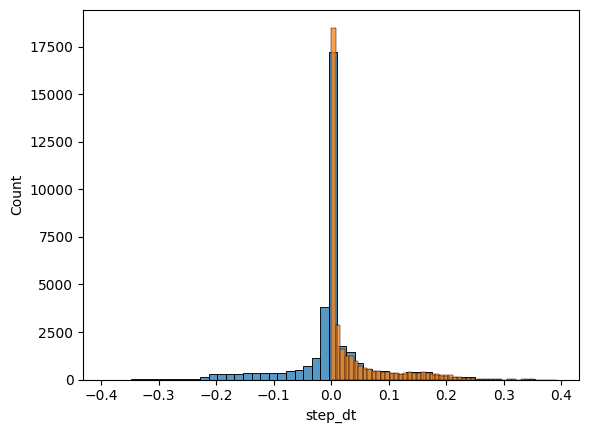

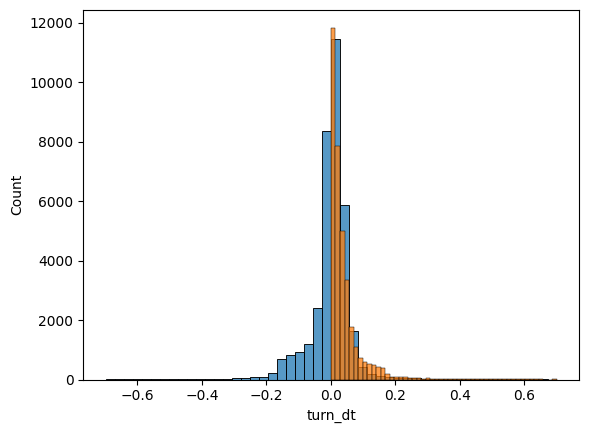

In [6]:
import matplotlib.pyplot as plt
# find 10% of acceleration values
tmp = EV_no_nan.dropna()
print(tmp.columns)
print(np.quantile(tmp['step_dt'], 0.1))
print(np.quantile(tmp['step_dt'], 0.9))
print(np.quantile(tmp['step_dt'].abs(), 0.9))
step_dt_threhold = np.quantile(tmp['step_dt'].abs(), 0.9)
step_dt_threhold_signed = (np.quantile(tmp['step_dt'], 0.9), np.quantile(tmp['step_dt'], 0.1))
# make histogram of step_dt
plt.figure()
sns.histplot(tmp['step_dt'], bins=50)
# make histogram of step_dt_abs
sns.histplot(tmp['step_dt'].abs(), bins=50)
# find 10% of angular acceleration values
print(np.quantile(tmp['turn_dt'], 0.1))
print(np.quantile(tmp['turn_dt'], 0.9))
print(np.quantile(tmp['turn_dt'].abs(), 0.9))
turn_dt_threhold = np.quantile(tmp['turn_dt'].abs(), 0.9)
turn_dt_threhold_signed = (np.quantile(tmp['turn_dt'], 0.9), np.quantile(tmp['turn_dt'], 0.1))
# new histogram of turn_dt
plt.figure()
sns.histplot(tmp['turn_dt'], bins=50)
# new histogram of turn_dt_abs
sns.histplot(tmp['turn_dt'].abs(), bins=50)


### subset around wind change

Index(['time', 'time_initial', 'v_para', 'v_perp', 'w', 'zeta', 'ep_idx',
       'time_since_last_wind_change', 'odor_lastenc', 'odor_01', 'step',
       'turn', 'step_dt', 'turn_dt', 'loc_x', 'loc_y',
       'wind_angle_ground_theta', 'plot_tidx'],
      dtype='object')
-0.08549801111221314
0.10547276735305788
0.1551729738712311
-0.099609072009931
0.05480745186345856
0.12557463099633398


<Axes: xlabel='turn_dt', ylabel='Count'>

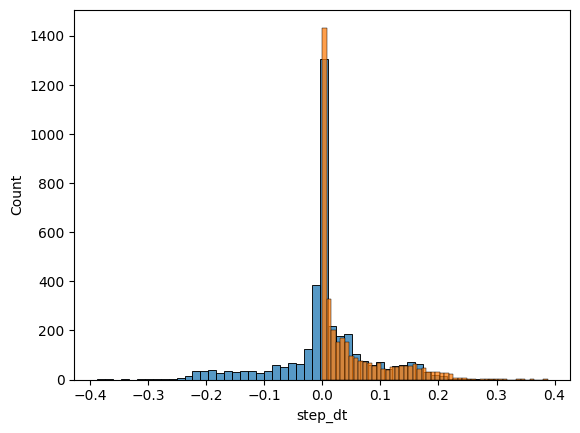

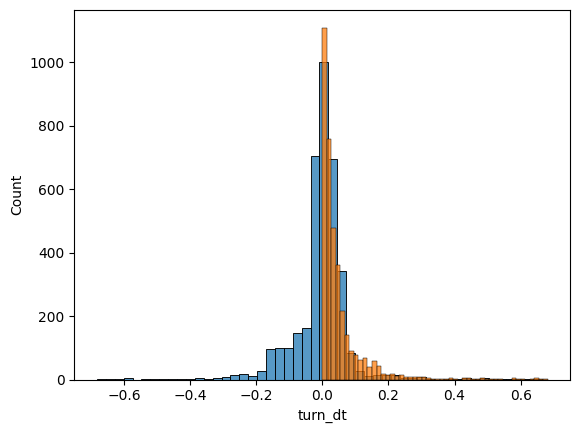

In [7]:
import matplotlib.pyplot as plt
# find 10% of acceleration values
print(EV_no_nan_around.columns)
print(np.quantile(EV_no_nan_around['step_dt'], 0.1))
print(np.quantile(EV_no_nan_around['step_dt'], 0.9))
print(np.quantile(EV_no_nan_around['step_dt'].abs(), 0.9))
step_dt_threhold = np.quantile(EV_no_nan_around['step_dt'].abs(), 0.9)
step_dt_threhold_signed = (np.quantile(EV_no_nan_around['step_dt'], 0.9), np.quantile(EV_no_nan_around['step_dt'], 0.1))
# make histogram of step_dt
plt.figure()
sns.histplot(EV_no_nan_around['step_dt'], bins=50)
# make histogram of step_dt_abs
sns.histplot(EV_no_nan_around['step_dt'].abs(), bins=50)
# find 10% of angular acceleration values
print(np.quantile(EV_no_nan_around['turn_dt'], 0.1))
print(np.quantile(EV_no_nan_around['turn_dt'], 0.9))
print(np.quantile(EV_no_nan_around['turn_dt'].abs(), 0.9))
turn_dt_threhold = np.quantile(EV_no_nan_around['turn_dt'].abs(), 0.9)
turn_dt_threhold_signed = (np.quantile(EV_no_nan_around['turn_dt'], 0.9), np.quantile(EV_no_nan_around['turn_dt'], 0.1))
# new histogram of turn_dt
plt.figure()
sns.histplot(EV_no_nan_around['turn_dt'], bins=50)
# new histogram of turn_dt_abs
sns.histplot(EV_no_nan_around['turn_dt'].abs(), bins=50)


### big change in action == more observable??

### *full ds

(2814, 17)
(2366, 17)
(146, 17)


<Axes: xlabel='zeta', ylabel='Count'>

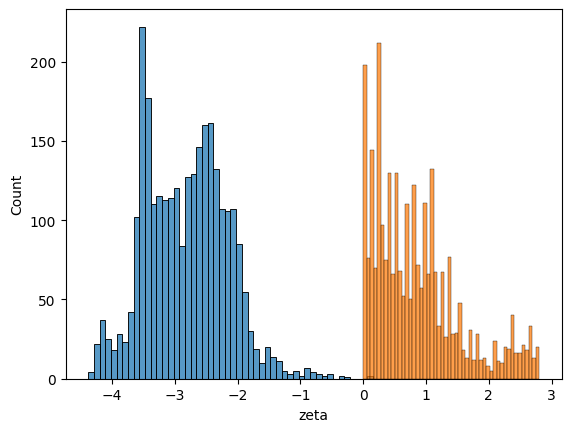

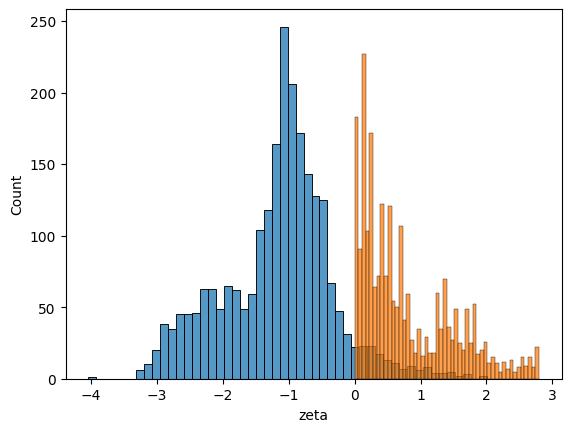

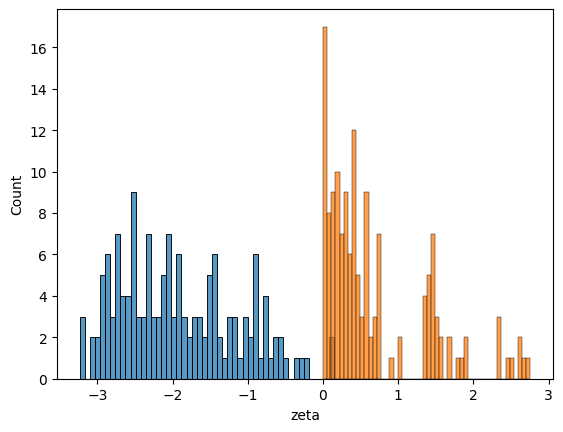

In [8]:
# print(EV_no_nan.columns)
large_step_dt = EV_no_nan[EV_no_nan['step_dt'].abs() > step_dt_threhold]
large_turn_dt = EV_no_nan[EV_no_nan['turn_dt'].abs() > turn_dt_threhold]
large_both_dt = EV_no_nan[(EV_no_nan['step_dt'].abs() > step_dt_threhold) & (EV_no_nan['turn_dt'].abs() > turn_dt_threhold)]
print(large_step_dt.shape)
print(large_turn_dt.shape)
print(large_both_dt.shape)

# plot their zetas
plt.figure()
sns.histplot(np.log10(large_step_dt['zeta']), bins=50)
sns.histplot(large_step_dt['time_since_last_wind_change'], bins=50, ax=plt.gca())
plt.figure()
sns.histplot(np.log10(large_turn_dt['zeta']), bins=50)
sns.histplot(large_turn_dt['time_since_last_wind_change'], bins=50, ax=plt.gca())
plt.figure()
sns.histplot(np.log10(large_both_dt['zeta']), bins=50)
sns.histplot(large_both_dt['time_since_last_wind_change'], bins=50, ax=plt.gca())
# plt.figure()
# sns.histplot(large_both_dt['ep_idx'], bins=50)

# # how far are they from the wind change
# plt.figure()
# sns.histplot(large_step_dt['time_since_last_wind_change'], bins=50)
# plt.figure()
# sns.histplot(large_turn_dt['time_since_last_wind_change'], bins=50)
# plt.figure()
# sns.histplot(large_both_dt['time_since_last_wind_change'], bins=50)

### shifted full ds

(2625, 20)
(2219, 20)
(146, 20)


<Axes: xlabel='zeta_shifted', ylabel='Count'>

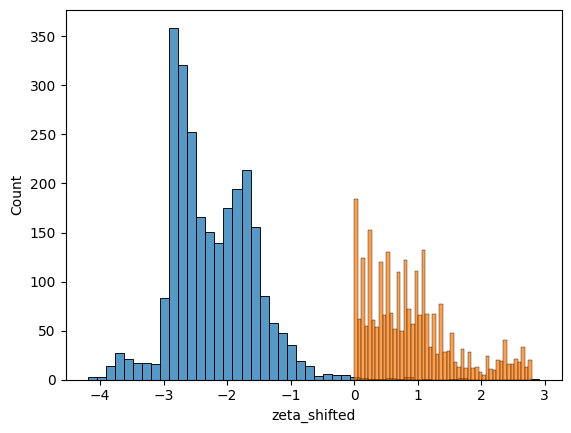

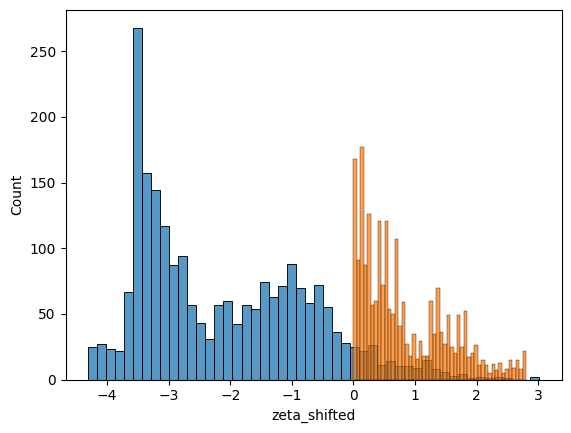

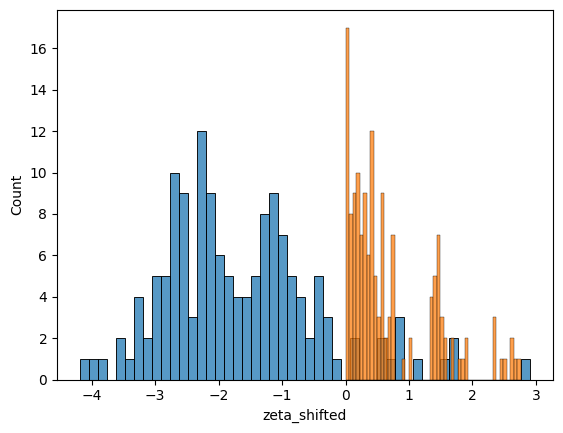

In [9]:
# print(EV_no_nan_shifted.columns)
large_step_dt = EV_no_nan_shifted[EV_no_nan_shifted['step_dt'].abs() > step_dt_threhold]
large_turn_dt = EV_no_nan_shifted[EV_no_nan_shifted['turn_dt'].abs() > turn_dt_threhold]
large_both_dt = EV_no_nan_shifted[(EV_no_nan_shifted['step_dt'].abs() > step_dt_threhold) & (EV_no_nan_shifted['turn_dt'].abs() > turn_dt_threhold)]
print(large_step_dt.shape)
print(large_turn_dt.shape)
print(large_both_dt.shape)

# plot their zetas
plt.figure()
sns.histplot(np.log10(large_step_dt['zeta_shifted']), bins=50)
sns.histplot(large_step_dt['time_since_last_wind_change'], bins=50, ax=plt.gca())
plt.figure()
sns.histplot(np.log10(large_turn_dt['zeta_shifted']), bins=50)
sns.histplot(large_turn_dt['time_since_last_wind_change'], bins=50, ax=plt.gca())
plt.figure()
sns.histplot(np.log10(large_both_dt['zeta_shifted']), bins=50)
sns.histplot(large_both_dt['time_since_last_wind_change'], bins=50, ax=plt.gca())
# plt.figure()
# sns.histplot(large_both_dt['ep_idx'], bins=50)

# # how far are they from the wind change
# plt.figure()
# sns.histplot(large_step_dt['time_since_last_wind_change'], bins=50)
# plt.figure()
# sns.histplot(large_turn_dt['time_since_last_wind_change'], bins=50)
# plt.figure()
# sns.histplot(large_both_dt['time_since_last_wind_change'], bins=50)

### sub around wind

Index(['time', 'time_initial', 'v_para', 'v_perp', 'w', 'zeta', 'ep_idx',
       'time_since_last_wind_change', 'odor_lastenc', 'odor_01', 'step',
       'turn', 'step_dt', 'turn_dt', 'loc_x', 'loc_y',
       'wind_angle_ground_theta', 'plot_tidx'],
      dtype='object')
(368, 18)
(368, 18)
(34, 18)


<Axes: xlabel='time_since_last_wind_change', ylabel='Count'>

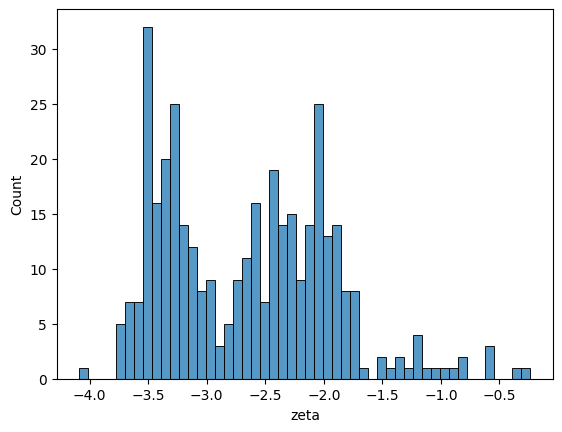

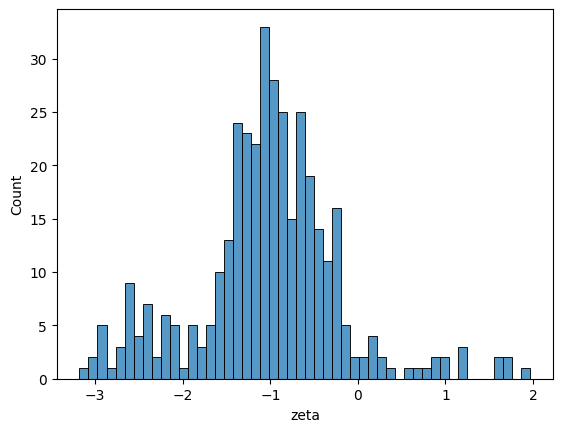

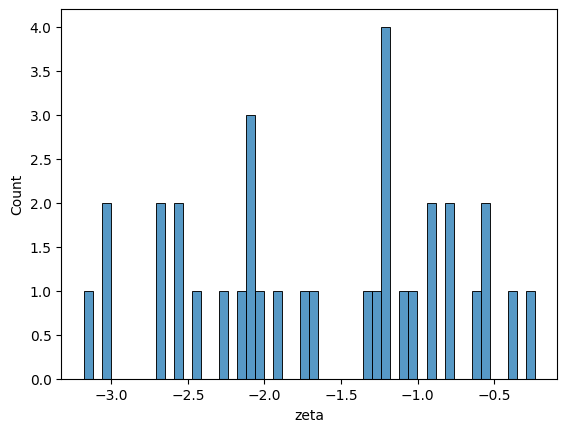

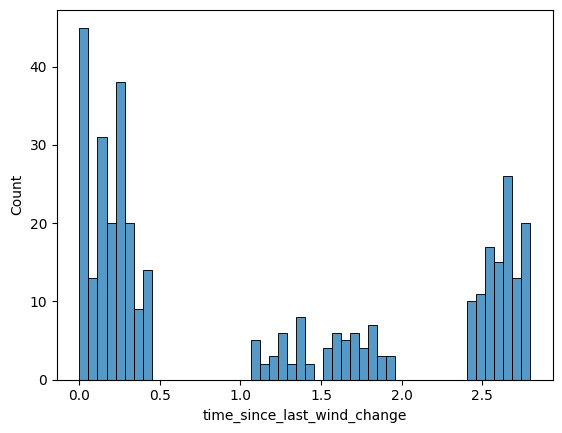

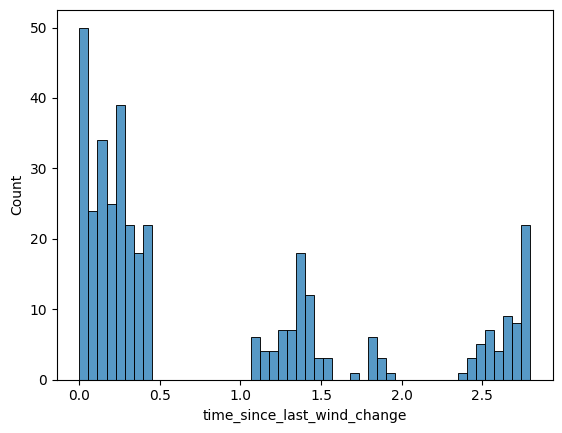

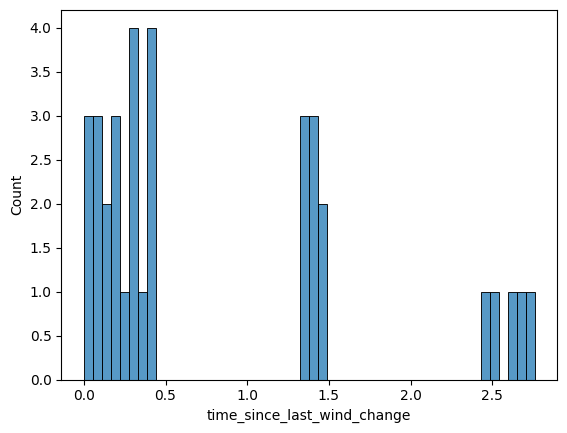

In [10]:
# step_dt_threhold
# step_dt_threhold_signed
# turn_dt_threhold
# turn_dt_threhold_signed
print(EV_no_nan_around.columns)

large_step_dt = EV_no_nan_around[EV_no_nan_around['step_dt'].abs() > step_dt_threhold]
large_turn_dt = EV_no_nan_around[EV_no_nan_around['turn_dt'].abs() > turn_dt_threhold]
large_both_dt = EV_no_nan_around[(EV_no_nan_around['step_dt'].abs() > step_dt_threhold) & (EV_no_nan_around['turn_dt'].abs() > turn_dt_threhold)]
print(large_step_dt.shape)
print(large_turn_dt.shape)
print(large_both_dt.shape)

# plot their zetas
plt.figure()
sns.histplot(np.log10(large_step_dt['zeta']), bins=50)
plt.figure()
sns.histplot(np.log10(large_turn_dt['zeta']), bins=50)
plt.figure()
sns.histplot(np.log10(large_both_dt['zeta']), bins=50)
# plt.figure()
# sns.histplot(large_both_dt['ep_idx'], bins=50)

# how far are they from the wind change
plt.figure()
sns.histplot(large_step_dt['time_since_last_wind_change'], bins=50)
plt.figure()
sns.histplot(large_turn_dt['time_since_last_wind_change'], bins=50)
plt.figure()
sns.histplot(large_both_dt['time_since_last_wind_change'], bins=50)

## 3D delta action, obs and time since last wind change

### preprocess

In [11]:
# where does each step and turn dt fall in the quantile?
EV_no_nan_around['step_dt_quantile'] = pd.qcut(EV_no_nan_around['step_dt'], q=10, labels=False)
EV_no_nan_around['turn_dt_quantile'] = pd.qcut(EV_no_nan_around['turn_dt'], q=10, labels=False)
EV_no_nan_around['step_dt_abs_quantile'] = pd.qcut(EV_no_nan_around['step_dt'].abs(), q=10, labels=False)
EV_no_nan_around['turn_dt_abs_quantile'] = pd.qcut(EV_no_nan_around['turn_dt'].abs(), q=10, labels=False)

EV_no_nan['step_dt_quantile'] = pd.qcut(EV_no_nan['step_dt'], q=10, labels=False)
EV_no_nan['turn_dt_quantile'] = pd.qcut(EV_no_nan['turn_dt'], q=10, labels=False)
EV_no_nan['step_dt_abs_quantile'] = pd.qcut(EV_no_nan['step_dt'].abs(), q=10, labels=False)
EV_no_nan['turn_dt_abs_quantile'] = pd.qcut(EV_no_nan['turn_dt'].abs(), q=10, labels=False)

### *full ds

In [13]:
# 3D interactive plot of zeta, step_dt, turn_dt, except using the quantile
import plotly.express as px
fig = px.scatter_3d(EV_no_nan, x='step_dt_abs_quantile', y='turn_dt_abs_quantile', z='zeta', color='time_since_last_wind_change')

# fig = px.scatter_3d(EV_no_nan_around, x='step_dt_abs_quantile', y='turn_dt_abs_quantile', z='zeta', color='time_since_last_wind_change')
# fig = px.scatter_3d(EV_no_nan_around, x='step_dt_quantile', y='turn_dt_quantile', z='zeta', color='time_since_last_wind_change')
# fig = px.scatter_3d(EV_no_nan_around, x='step_dt_quantile', y='turn_dt_quantile', z='zeta', color='plot_tidx')
# make z axis log scale
fig.update_layout(scene_zaxis_type="log")
# invert the z axis
fig.update_layout(scene_zaxis_autorange="reversed")
fig.update_layout(scene_xaxis_autorange="reversed")
fig.show()


### subset

In [14]:
# 3D interactive plot of zeta, step_dt, turn_dt, except using the quantile
import plotly.express as px
# fig = px.scatter_3d(EV_no_nan, x='step_dt_abs_quantile', y='turn_dt_abs_quantile', z='zeta', color='time_since_last_wind_change')

fig = px.scatter_3d(EV_no_nan_around, x='step_dt_abs_quantile', y='turn_dt_abs_quantile', z='zeta', color='time_since_last_wind_change')
# fig = px.scatter_3d(EV_no_nan_around, x='step_dt_quantile', y='turn_dt_quantile', z='zeta', color='time_since_last_wind_change')
# fig = px.scatter_3d(EV_no_nan_around, x='step_dt_quantile', y='turn_dt_quantile', z='zeta', color='plot_tidx')
# make z axis log scale
fig.update_layout(scene_zaxis_type="log")
# invert the z axis
fig.update_layout(scene_zaxis_autorange="reversed")
fig.update_layout(scene_xaxis_autorange="reversed")
fig.show()


### plot not by quantile

In [ ]:
# 3D interactive plot of zeta, step_dt, turn_dt
import plotly.express as px
EV_no_nan_around['color'] = ['r' if pidx > 0 and pidx < 4 else 'b' for pidx in EV_no_nan_around['plot_tidx']]
# EV_no_nan_around['color'] = ['r' if pidx > 0 and pidx < 4 else 'b' for pidx in EV_no_nan_around['plot_tidx']]
# fig = px.scatter_3d(EV_no_nan_around, x='step_dt', y='turn_dt', z='zeta', color='color', opacity=0.7)
fig = px.scatter_3d(EV_no_nan, x='step_dt', y='turn_dt', z='zeta', color='time_since_last_wind_change', opacity=0.7)
# make z axis log scale
fig.update_layout(scene_zaxis_type="log")
fig.update_layout(scene_zaxis_autorange="reversed")
fig.show()


# large delta actions by ep_idx

## preprocess

In [ ]:
# find the quantile of step_dt and turn_dt for each episode
EV_no_nan_around['step_dt_quantile_per_eps'] = EV_no_nan_around.groupby('ep_idx')['step_dt'].transform(lambda x: pd.qcut(x, q=10, labels=False))
EV_no_nan_around['turn_dt_quantile_per_eps'] = EV_no_nan_around.groupby('ep_idx')['turn_dt'].transform(lambda x: pd.qcut(x, q=10, labels=False))
EV_no_nan_around['step_dt_abs_quantile_per_eps'] = EV_no_nan_around.groupby('ep_idx')['step_dt'].transform(lambda x: pd.qcut(x.abs(), q=10, labels=False))
EV_no_nan_around['turn_dt_abs_quantile_per_eps'] = EV_no_nan_around.groupby('ep_idx')['turn_dt'].transform(lambda x: pd.qcut(x.abs(), q=10, labels=False))

EV_no_nan['step_dt_quantile_per_eps'] = EV_no_nan.groupby('ep_idx')['step_dt'].transform(lambda x: pd.qcut(x, q=10, labels=False))
EV_no_nan['turn_dt_quantile_per_eps'] = EV_no_nan.groupby('ep_idx')['turn_dt'].transform(lambda x: pd.qcut(x, q=10, labels=False))
EV_no_nan['step_dt_abs_quantile_per_eps'] = EV_no_nan.groupby('ep_idx')['step_dt'].transform(lambda x: pd.qcut(x.abs(), q=10, labels=False))
EV_no_nan['turn_dt_abs_quantile_per_eps'] = EV_no_nan.groupby('ep_idx')['turn_dt'].transform(lambda x: pd.qcut(x.abs(), q=10, labels=False))

EV_no_nan_shifted['step_dt_quantile_per_eps'] = EV_no_nan_shifted.groupby('ep_idx')['step_dt'].transform(lambda x: pd.qcut(x, q=10, labels=False))
EV_no_nan_shifted['turn_dt_quantile_per_eps'] = EV_no_nan_shifted.groupby('ep_idx')['turn_dt'].transform(lambda x: pd.qcut(x, q=10, labels=False))
EV_no_nan_shifted['step_dt_abs_quantile_per_eps'] = EV_no_nan_shifted.groupby('ep_idx')['step_dt'].transform(lambda x: pd.qcut(x.abs(), q=10, labels=False))
EV_no_nan_shifted['turn_dt_abs_quantile_per_eps'] = EV_no_nan_shifted.groupby('ep_idx')['turn_dt'].transform(lambda x: pd.qcut(x.abs(), q=10, labels=False))

## when are they happening?

### full ds

Index(['time', 'time_initial', 'v_para', 'v_perp', 'w', 'zeta', 'ep_idx',
       'time_since_last_wind_change', 'odor_lastenc', 'odor_01', 'step',
       'turn', 'step_dt', 'turn_dt', 'loc_x', 'loc_y',
       'wind_angle_ground_theta', 'step_dt_quantile', 'turn_dt_quantile',
       'step_dt_abs_quantile', 'turn_dt_abs_quantile',
       'step_dt_quantile_per_eps', 'turn_dt_quantile_per_eps',
       'step_dt_abs_quantile_per_eps', 'turn_dt_abs_quantile_per_eps'],
      dtype='object')
(3597, 25)
(3577, 25)
(232, 25)


Text(0.5, 1.0, 'time_since_last_wind_change for large both_dt')

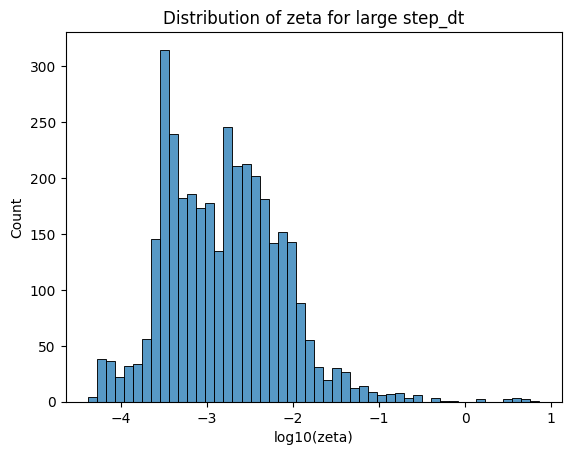

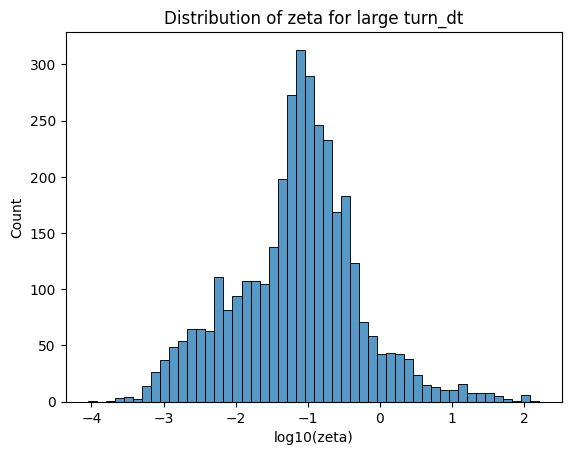

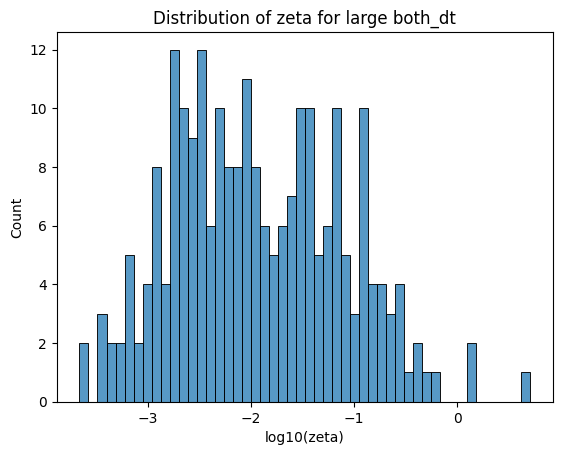

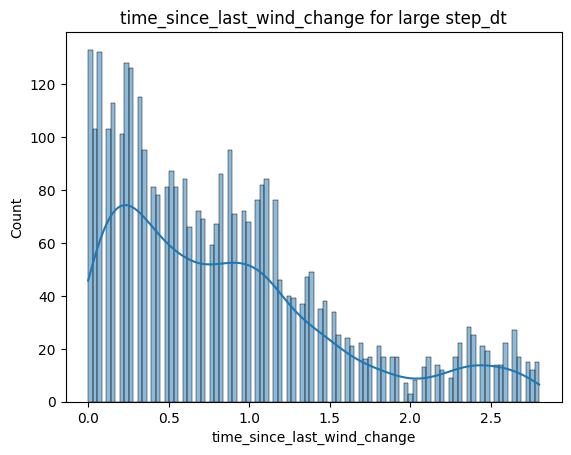

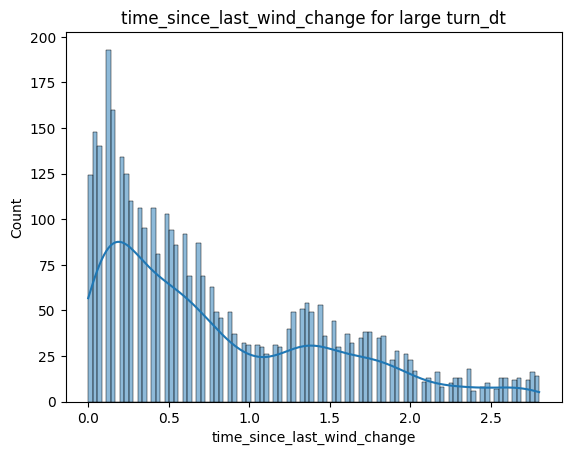

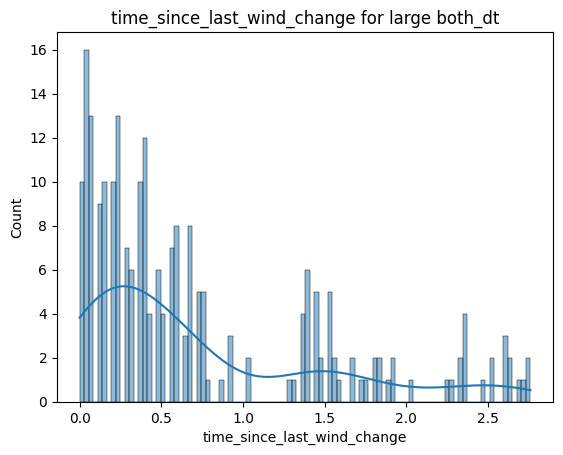

In [16]:
print(EV_no_nan.columns)
bins = 100
percentile = 8.9
large_step_dt = EV_no_nan[EV_no_nan['step_dt_abs_quantile_per_eps'].abs() > percentile]
large_turn_dt = EV_no_nan[EV_no_nan['turn_dt_abs_quantile_per_eps'].abs() > percentile]
large_both_dt = EV_no_nan[(EV_no_nan['step_dt_abs_quantile_per_eps'].abs() > percentile) & (EV_no_nan['turn_dt_abs_quantile_per_eps'].abs() > percentile)]
print(large_step_dt.shape)
print(large_turn_dt.shape)
print(large_both_dt.shape)

# plot their zetas
plt.figure()
sns.histplot(np.log10(large_step_dt['zeta']), bins=50)
# add label
plt.xlabel('log10(zeta)')
plt.title('Distribution of zeta for large step_dt')
plt.figure()
sns.histplot(np.log10(large_turn_dt['zeta']), bins=50)
plt.xlabel('log10(zeta)')
plt.title('Distribution of zeta for large turn_dt')
plt.figure()
sns.histplot(np.log10(large_both_dt['zeta']), bins=50)
plt.xlabel('log10(zeta)')
plt.title('Distribution of zeta for large both_dt')
# plt.figure()
# sns.histplot(large_both_dt['ep_idx'], bins=bins)


# how far are they from the wind change
plt.figure()
sns.histplot(large_step_dt['time_since_last_wind_change'], bins=bins, kde=True)
plt.title('time_since_last_wind_change for large step_dt')
plt.figure()
sns.histplot(large_turn_dt['time_since_last_wind_change'], bins=bins, kde=True)
plt.title('time_since_last_wind_change for large turn_dt')
plt.figure()
sns.histplot(large_both_dt['time_since_last_wind_change'], bins=bins, kde=True)
plt.title('time_since_last_wind_change for large both_dt')

### full ds shifted zeta

Index(['time', 'time_initial', 'v_para', 'v_perp', 'w', 'zeta', 'ep_idx',
       'time_since_last_wind_change', 'odor_lastenc', 'odor_01', 'step',
       'turn', 'step_dt', 'turn_dt', 'loc_x', 'loc_y',
       'wind_angle_ground_theta', 'zeta_shifted', 'zeta_shifted_qcut',
       'zeta_shifted_qcut_per_eps', 'step_dt_quantile_per_eps',
       'turn_dt_quantile_per_eps', 'step_dt_abs_quantile_per_eps',
       'turn_dt_abs_quantile_per_eps'],
      dtype='object')
(3437, 24)
(3437, 24)
(242, 24)


Text(0.5, 1.0, 'time_since_last_wind_change for large both_dt')

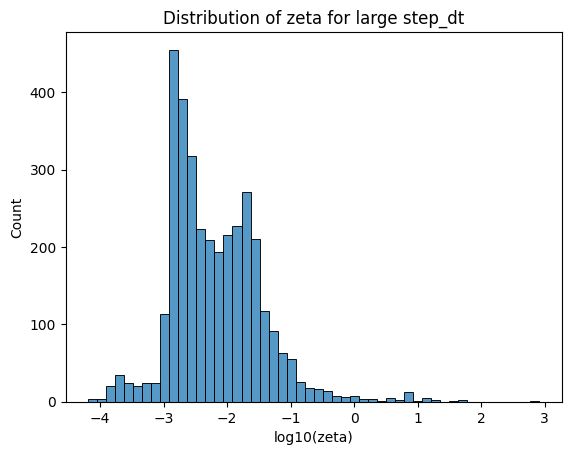

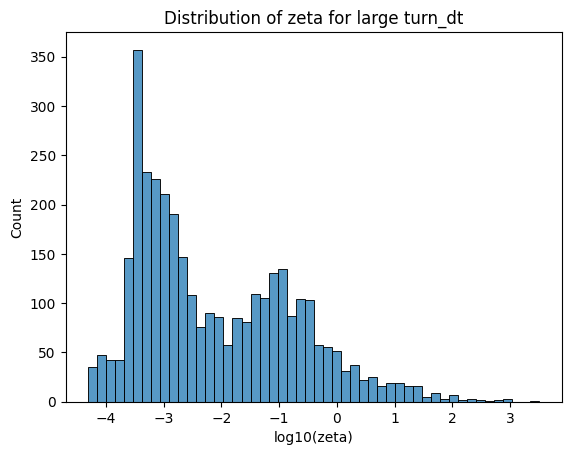

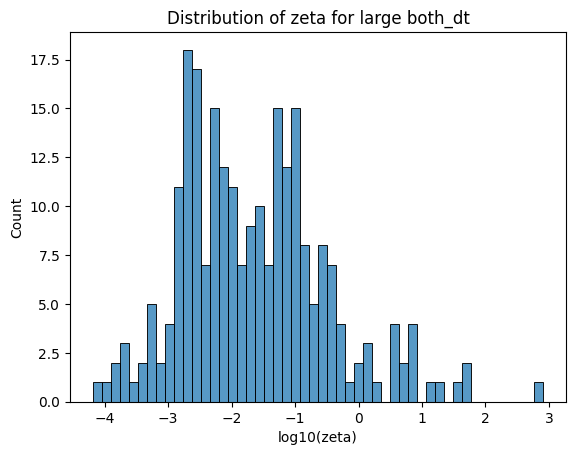

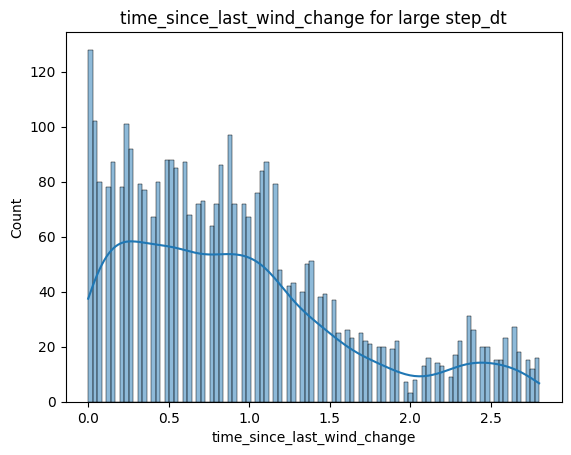

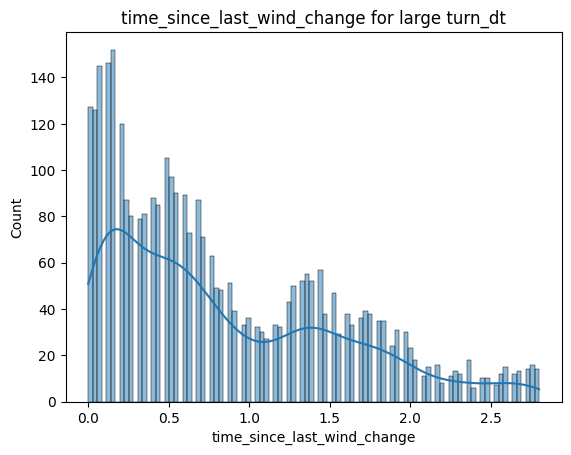

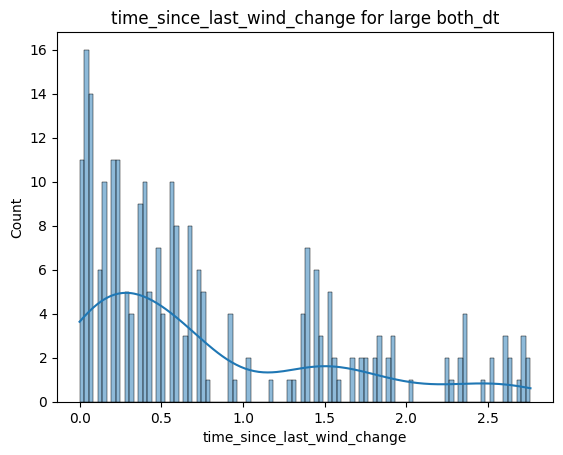

In [17]:
print(EV_no_nan_shifted.columns)
bins = 100
percentile = 8.9
large_step_dt = EV_no_nan_shifted[EV_no_nan_shifted['step_dt_abs_quantile_per_eps'].abs() > percentile]
large_turn_dt = EV_no_nan_shifted[EV_no_nan_shifted['turn_dt_abs_quantile_per_eps'].abs() > percentile]
large_both_dt = EV_no_nan_shifted[(EV_no_nan_shifted['step_dt_abs_quantile_per_eps'].abs() > percentile) & (EV_no_nan_shifted['turn_dt_abs_quantile_per_eps'].abs() > percentile)]
print(large_step_dt.shape)
print(large_turn_dt.shape)
print(large_both_dt.shape)

# plot their zetas
plt.figure()
sns.histplot(np.log10(large_step_dt['zeta_shifted']), bins=50)
# add label
plt.xlabel('log10(zeta)')
plt.title('Distribution of zeta for large step_dt')
plt.figure()
sns.histplot(np.log10(large_turn_dt['zeta_shifted']), bins=50)
plt.xlabel('log10(zeta)')
plt.title('Distribution of zeta for large turn_dt')
plt.figure()
sns.histplot(np.log10(large_both_dt['zeta_shifted']), bins=50)
plt.xlabel('log10(zeta)')
plt.title('Distribution of zeta for large both_dt')
# plt.figure()
# sns.histplot(large_both_dt['ep_idx'], bins=bins)


# how far are they from the wind change
plt.figure()
sns.histplot(large_step_dt['time_since_last_wind_change'], bins=bins, kde=True)
plt.title('time_since_last_wind_change for large step_dt')
plt.figure()
sns.histplot(large_turn_dt['time_since_last_wind_change'], bins=bins, kde=True)
plt.title('time_since_last_wind_change for large turn_dt')
plt.figure()
sns.histplot(large_both_dt['time_since_last_wind_change'], bins=bins, kde=True)
plt.title('time_since_last_wind_change for large both_dt')

### full ds without first 10 rows

(30160, 25)
(30220, 25)
(27434, 25)


Text(0.5, 1.0, 'time_since_last_wind_change for large both_dt')

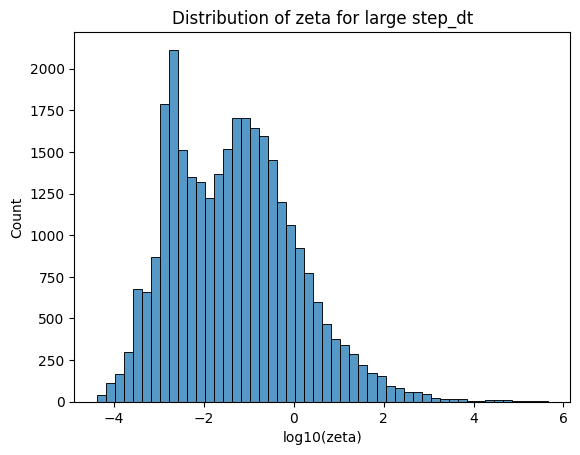

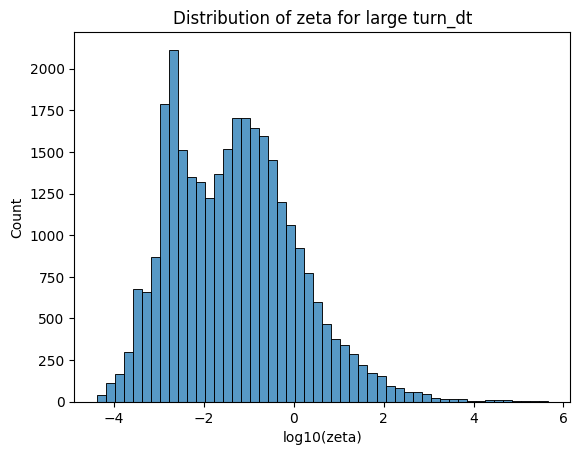

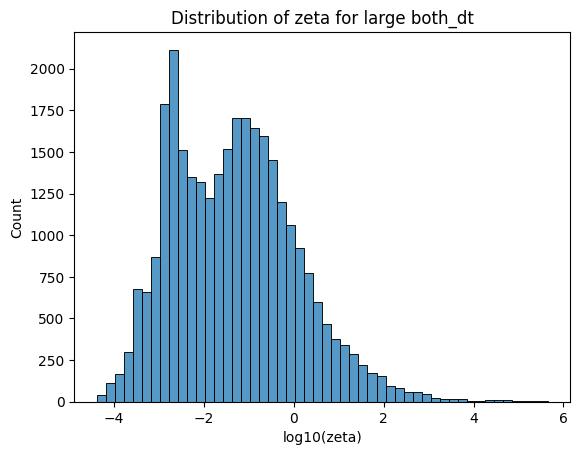

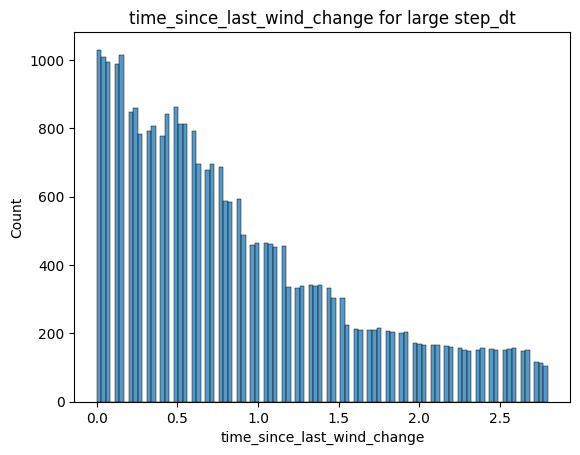

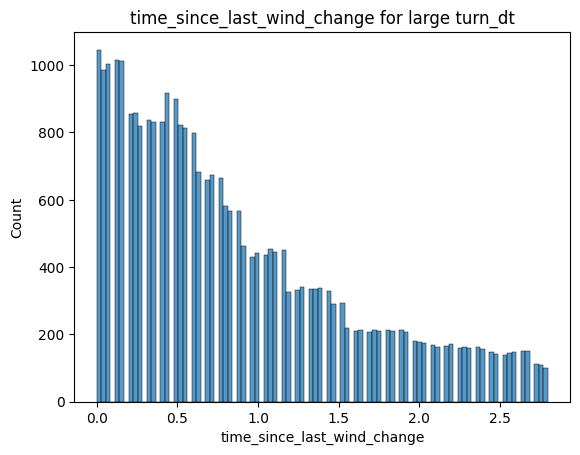

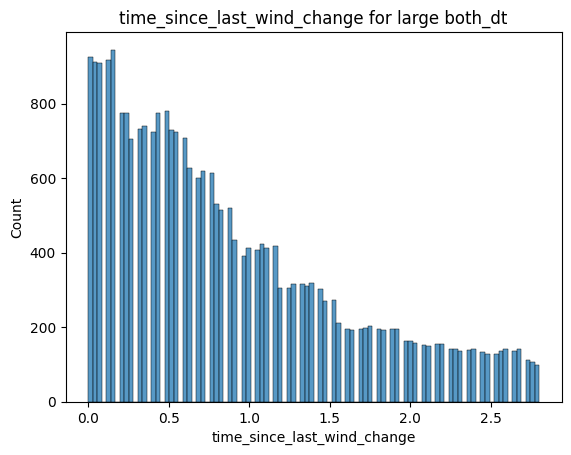

In [18]:
tmp = EV_no_nan.copy()
# drop the first 10 rows of each episode
tmp = tmp.groupby('ep_idx').apply(lambda x: x.iloc[10:]).reset_index(drop=True)
bins = 100
percentile = 0.9
large_step_dt = tmp[tmp['step_dt_abs_quantile_per_eps'] > percentile]
large_turn_dt = tmp[tmp['turn_dt_abs_quantile_per_eps'] > percentile]
large_both_dt = tmp[(tmp['step_dt_abs_quantile_per_eps'] > percentile) & (tmp['turn_dt_abs_quantile_per_eps'] > percentile)]
print(large_step_dt.shape)
print(large_turn_dt.shape)
print(large_both_dt.shape)


# plot their zetas
plt.figure()
sns.histplot(np.log10(large_step_dt['zeta']), bins=50)
# add label
plt.xlabel('log10(zeta)')
plt.title('Distribution of zeta for large step_dt')
plt.figure()
sns.histplot(np.log10(large_step_dt['zeta']), bins=50)
plt.xlabel('log10(zeta)')
plt.title('Distribution of zeta for large turn_dt')
plt.figure()
sns.histplot(np.log10(large_step_dt['zeta']), bins=50)
plt.xlabel('log10(zeta)')
plt.title('Distribution of zeta for large both_dt')
# plt.figure()
# sns.histplot(large_both_dt['ep_idx'], bins=bins)


# how far are they from the wind change
plt.figure()
sns.histplot(large_step_dt['time_since_last_wind_change'], bins=bins)
plt.title('time_since_last_wind_change for large step_dt')
plt.figure()
sns.histplot(large_turn_dt['time_since_last_wind_change'], bins=bins)
plt.title('time_since_last_wind_change for large turn_dt')
plt.figure()
sns.histplot(large_both_dt['time_since_last_wind_change'], bins=bins)
plt.title('time_since_last_wind_change for large both_dt')

### subset

In [ ]:
print(EV_no_nan_around.columns)
bins = 100
percentile = 8.9
large_step_dt = EV_no_nan_around[EV_no_nan_around['step_dt_abs_quantile_per_eps'].abs() > percentile]
large_turn_dt = EV_no_nan_around[EV_no_nan_around['turn_dt_abs_quantile_per_eps'].abs() > percentile]
large_both_dt = EV_no_nan_around[(EV_no_nan_around['step_dt_abs_quantile_per_eps'].abs() > percentile) & (EV_no_nan_around['turn_dt_abs_quantile_per_eps'].abs() > percentile)]
print(large_step_dt.shape)
print(large_turn_dt.shape)
print(large_both_dt.shape)


# plot their zetas
plt.figure()
sns.histplot(np.log10(large_step_dt['zeta']), bins=50)
# add label
plt.xlabel('log10(zeta)')
plt.title('Distribution of zeta for large step_dt')
plt.figure()
sns.histplot(np.log10(large_step_dt['zeta']), bins=50)
plt.xlabel('log10(zeta)')
plt.title('Distribution of zeta for large turn_dt')
plt.figure()
sns.histplot(np.log10(large_step_dt['zeta']), bins=50)
plt.xlabel('log10(zeta)')
plt.title('Distribution of zeta for large both_dt')
# plt.figure()
# sns.histplot(large_both_dt['ep_idx'], bins=bins)


# how far are they from the wind change
plt.figure()
sns.histplot(large_step_dt['time_since_last_wind_change'], bins=bins)
plt.title('time_since_last_wind_change for large step_dt')
plt.figure()
sns.histplot(large_turn_dt['time_since_last_wind_change'], bins=bins)
plt.title('time_since_last_wind_change for large turn_dt')
plt.figure()
sns.histplot(large_both_dt['time_since_last_wind_change'], bins=bins)
plt.title('time_since_last_wind_change for large both_dt')

## compare quantiles

### full ds

In [10]:
filtered_df['time_since_last_wind_change'].describe()

count    173233.000000
mean          0.980552
std           0.767011
min           0.000000
25%           0.320000
50%           0.800000
75%           1.520000
max           2.960000
Name: time_since_last_wind_change, dtype: float64

#### step delta

[0. 1. 2. 3. 4. 5. 6. 7. 8. 9.]
Integral using Trapezoidal Rule: 0.9416
Integral using Trapezoidal Rule: 0.9396
Integral using Trapezoidal Rule: 0.9383
Integral using Trapezoidal Rule: 0.9329
Integral using Trapezoidal Rule: 0.9376
Integral using Trapezoidal Rule: 0.9383
Integral using Trapezoidal Rule: 0.9349
Integral using Trapezoidal Rule: 0.9362
Integral using Trapezoidal Rule: 0.9386
Integral using Trapezoidal Rule: 0.9430


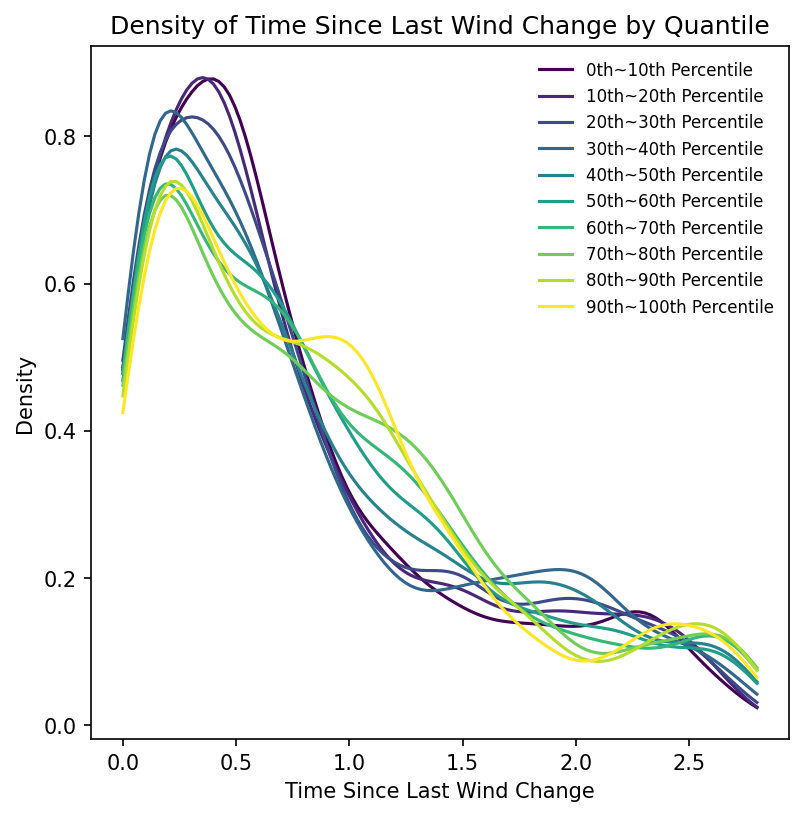

In [47]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import gaussian_kde
import matplotlib.cm as cm
# from scipy.integrate import simps 

# Sort quantiles
EV_no_nan.dropna(inplace=True)
quantiles = EV_no_nan['step_dt_abs_quantile_per_eps'].unique()
quantiles.sort()
print(quantiles)
# Set up plot
fig, ax = plt.subplots(figsize=(6, 6), dpi=150)

# Generate distinct colors using a colormap
cmap = cm.get_cmap('viridis', len(quantiles))  # 'viridis' ensures good contrast
# cmap = cm.get_cmap('Purples', len(quantiles))  # 'viridis' ensures good contrast

# Iterate over quantiles and plot density
for i, now_qt in enumerate(quantiles):
    tmp_df = EV_no_nan[EV_no_nan['step_dt_abs_quantile_per_eps'] == now_qt]
    
    if len(tmp_df) > 1:
        kde = gaussian_kde(tmp_df['time_since_last_wind_change'])
        

        # integrate the density to get the probability
        x_vals = np.linspace(tmp_df['time_since_last_wind_change'].min(), 
                             tmp_df['time_since_last_wind_change'].max(), 120)
        kde_vals = kde(x_vals)
        # Compute integral using Trapezoidal Rule
        integral_trapz = np.trapz(kde_vals, x_vals)
        print(f"Integral using Trapezoidal Rule: {integral_trapz:.4f}")
        # ax.plot(x_vals, kde(x_vals), color=cmap(i))
        ax.plot(x_vals, kde(x_vals), color=cmap(i), label=f'{int(now_qt*10)}th~{int((now_qt+1)*10)}th Percentile')
# for i, now_qt in enumerate(quantiles):
#     ax.text(0.8, 0.9 - (i * 0.05), f'Quantile {now_qt}', 
#             color=cmap(i), transform=ax.transAxes, fontsize=8,
#             bbox=dict(facecolor='lightgray', edgecolor='lightgray', boxstyle='round,pad=0.3'))

# Add legend and labels
ax.set_xlabel("Time Since Last Wind Change")
ax.set_ylabel("Density")
ax.set_title("Density of Time Since Last Wind Change by Quantile")
ax.legend(loc='best', fontsize=8, frameon=False, facecolor='lightgray')


plt.show()

#### turn delta

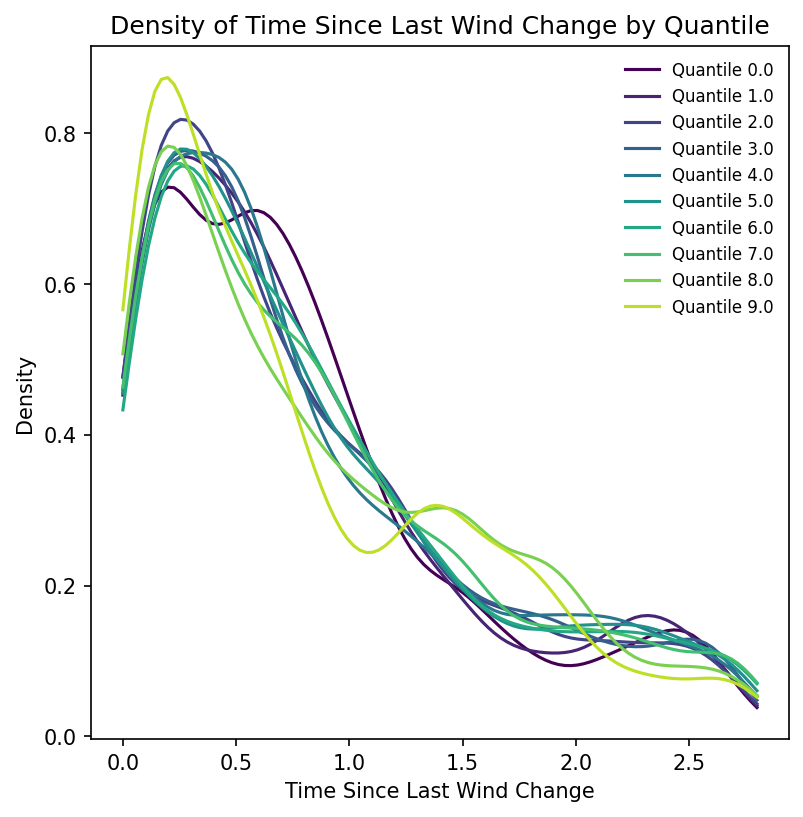

In [25]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import gaussian_kde
import matplotlib.cm as cm

# Sort quantiles
quantiles = EV_no_nan['turn_dt_abs_quantile_per_eps'].unique()
quantiles.sort()

# Set up plot
fig, ax = plt.subplots(figsize=(6, 6), dpi=150)

# Generate distinct colors using a colormap
cmap = cm.get_cmap('viridis', len(quantiles))  # 'viridis' ensures good contrast

# Iterate over quantiles and plot density
for i, now_qt in enumerate(quantiles):
    tmp_df = EV_no_nan[EV_no_nan['turn_dt_abs_quantile_per_eps'] == now_qt]
    
    if len(tmp_df) > 1:
        kde = gaussian_kde(tmp_df['time_since_last_wind_change'])
        x_vals = np.linspace(tmp_df['time_since_last_wind_change'].min(), 
                             tmp_df['time_since_last_wind_change'].max(), 100)
        ax.plot(x_vals, kde(x_vals), color=cmap(i), label=f'Quantile {now_qt}')

# Add legend and labels
ax.set_xlabel("Time Since Last Wind Change")
ax.set_ylabel("Density")
ax.set_title("Density of Time Since Last Wind Change by Quantile")
ax.legend(loc='best', fontsize=8, frameon=False)

plt.show()

### shifted

#### step delta

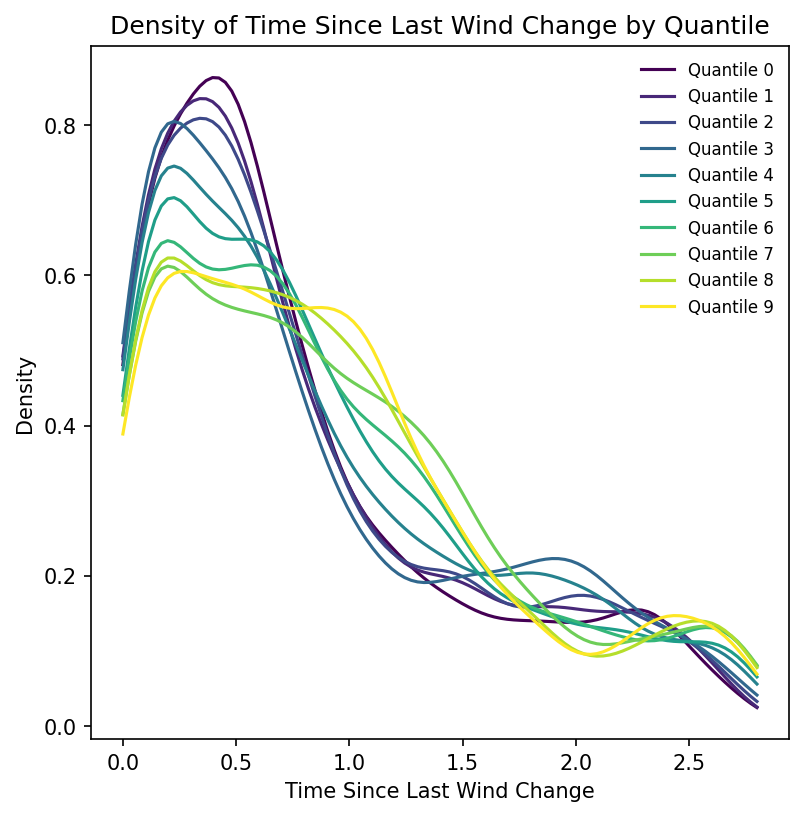

In [26]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import gaussian_kde
import matplotlib.cm as cm

# Sort quantiles
quantiles = EV_no_nan_shifted['step_dt_abs_quantile_per_eps'].unique()
quantiles.sort()

# Set up plot
fig, ax = plt.subplots(figsize=(6, 6), dpi=150)

# Generate distinct colors using a colormap
cmap = cm.get_cmap('viridis', len(quantiles))  # 'viridis' ensures good contrast

# Iterate over quantiles and plot density
for i, now_qt in enumerate(quantiles):
    tmp_df = EV_no_nan_shifted[EV_no_nan_shifted['step_dt_abs_quantile_per_eps'] == now_qt]
    
    if len(tmp_df) > 1:
        kde = gaussian_kde(tmp_df['time_since_last_wind_change'])
        x_vals = np.linspace(tmp_df['time_since_last_wind_change'].min(), 
                             tmp_df['time_since_last_wind_change'].max(), 100)
        ax.plot(x_vals, kde(x_vals), color=cmap(i), label=f'Quantile {now_qt}')

# Add legend and labels
ax.set_xlabel("Time Since Last Wind Change")
ax.set_ylabel("Density")
ax.set_title("Density of Time Since Last Wind Change by Quantile")
ax.legend(loc='best', fontsize=8, frameon=False)

plt.show()

#### turn delta

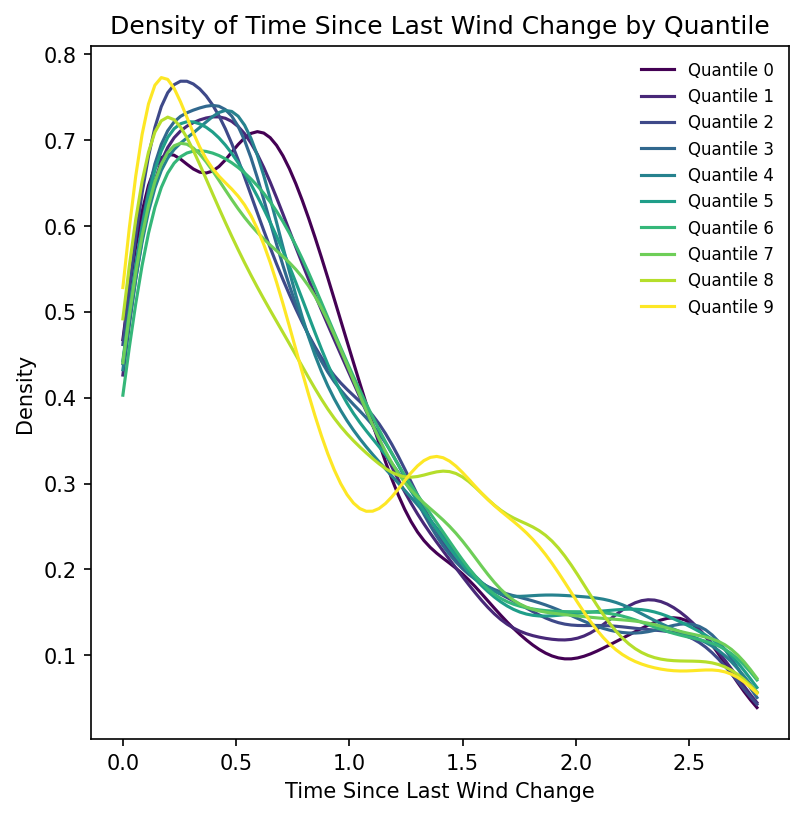

In [28]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import gaussian_kde
import matplotlib.cm as cm

# Sort quantiles
quantiles = EV_no_nan_shifted['turn_dt_abs_quantile_per_eps'].unique()
quantiles.sort()

# Set up plot
fig, ax = plt.subplots(figsize=(6, 6), dpi=150)

# Generate distinct colors using a colormap
cmap = cm.get_cmap('viridis', len(quantiles))  # 'viridis' ensures good contrast

# Iterate over quantiles and plot density
for i, now_qt in enumerate(quantiles):
    tmp_df = EV_no_nan_shifted[EV_no_nan_shifted['turn_dt_abs_quantile_per_eps'] == now_qt]
    
    if len(tmp_df) > 1:
        kde = gaussian_kde(tmp_df['time_since_last_wind_change'])
        x_vals = np.linspace(tmp_df['time_since_last_wind_change'].min(), 
                             tmp_df['time_since_last_wind_change'].max(), 100)
        ax.plot(x_vals, kde(x_vals), color=cmap(i), label=f'Quantile {now_qt}')

# Add legend and labels
ax.set_xlabel("Time Since Last Wind Change")
ax.set_ylabel("Density")
ax.set_title("Density of Time Since Last Wind Change by Quantile")
ax.legend(loc='best', fontsize=8, frameon=False)

plt.show()

## all trials

### preprocess

In [14]:
filtered_df['step_dt_quantile_per_eps'] = filtered_df.groupby('ep_idx')['step_dt'].transform(lambda x: pd.qcut(x, q=10, labels=False))
filtered_df['turn_dt_quantile_per_eps'] = filtered_df.groupby('ep_idx')['turn_dt'].transform(lambda x: pd.qcut(x, q=10, labels=False))
filtered_df['step_dt_abs_quantile_per_eps'] = filtered_df.groupby('ep_idx')['step_dt'].transform(lambda x: pd.qcut(x.abs(), q=10, labels=False))
filtered_df['turn_dt_abs_quantile_per_eps'] = filtered_df.groupby('ep_idx')['turn_dt'].transform(lambda x: pd.qcut(x.abs(), q=10, labels=False))


### step delta

[0. 1. 2. 3. 4. 5. 6. 7. 8. 9.]
Integral using Trapezoidal Rule: 0.9719
Integral using Trapezoidal Rule: 0.9725
Integral using Trapezoidal Rule: 0.9698
Integral using Trapezoidal Rule: 0.9684
Integral using Trapezoidal Rule: 0.9657
Integral using Trapezoidal Rule: 0.9657
Integral using Trapezoidal Rule: 0.9624
Integral using Trapezoidal Rule: 0.9588
Integral using Trapezoidal Rule: 0.9557
Integral using Trapezoidal Rule: 0.9378


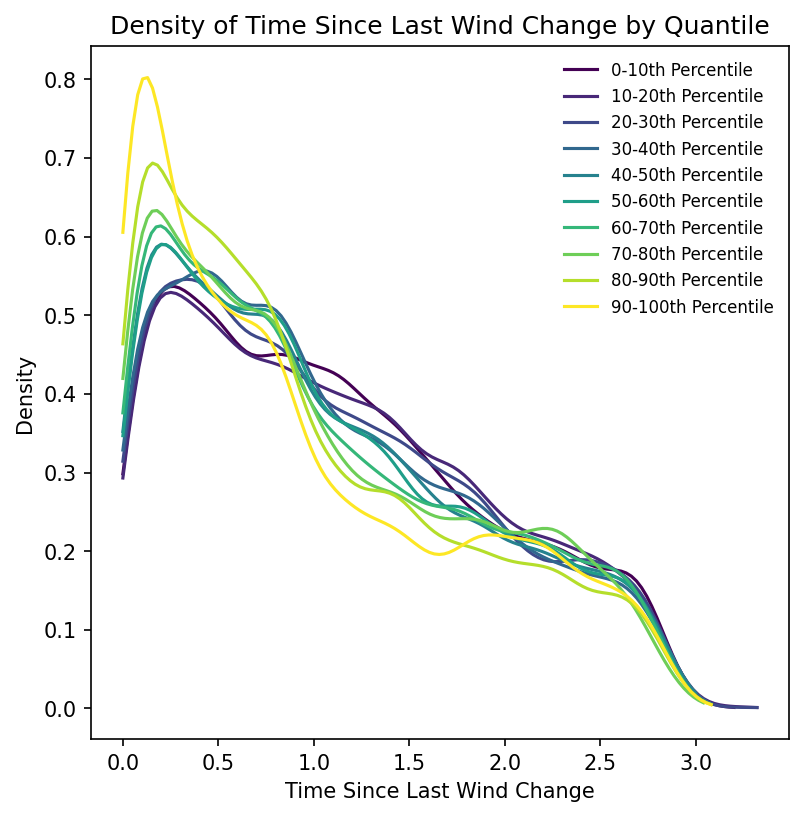

In [19]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import gaussian_kde
import matplotlib.cm as cm
# from scipy.integrate import simps 

# Sort quantiles
filtered_df.dropna(inplace=True)
quantiles = filtered_df['step_dt_abs_quantile_per_eps'].unique()
quantiles.sort()
print(quantiles)
# Set up plot
fig, ax = plt.subplots(figsize=(6, 6), dpi=150)

# Generate distinct colors using a colormap
cmap = cm.get_cmap('viridis', len(quantiles))  # 'viridis' ensures good contrast
# cmap = cm.get_cmap('Purples', len(quantiles))  # 'viridis' ensures good contrast

# Iterate over quantiles and plot density
for i, now_qt in enumerate(quantiles):
    tmp_df = filtered_df[filtered_df['step_dt_abs_quantile_per_eps'] == now_qt]
    
    if len(tmp_df) > 1:
        kde = gaussian_kde(tmp_df['time_since_last_wind_change'])
        

        # integrate the density to get the probability
        x_vals = np.linspace(tmp_df['time_since_last_wind_change'].min(), 
                             tmp_df['time_since_last_wind_change'].max(), 120)
        kde_vals = kde(x_vals)
        # Compute integral using Trapezoidal Rule
        integral_trapz = np.trapz(kde_vals, x_vals)
        print(f"Integral using Trapezoidal Rule: {integral_trapz:.4f}")
        # ax.plot(x_vals, kde(x_vals), color=cmap(i))
        ax.plot(x_vals, kde(x_vals), color=cmap(i), label=f'{int(now_qt*10)}-{int((now_qt+1)*10)}th Percentile')
# for i, now_qt in enumerate(quantiles):
#     ax.text(0.8, 0.9 - (i * 0.05), f'Quantile {now_qt}', 
#             color=cmap(i), transform=ax.transAxes, fontsize=8,
#             bbox=dict(facecolor='lightgray', edgecolor='lightgray', boxstyle='round,pad=0.3'))

# Add legend and labels
ax.set_xlabel("Time Since Last Wind Change")
ax.set_ylabel("Density")
ax.set_title("Density of Time Since Last Wind Change by Quantile")
ax.legend(loc='best', fontsize=8, frameon=False, facecolor='lightgray')


plt.show()

### turn delta

[0. 1. 2. 3. 4. 5. 6. 7. 8. 9.]
Integral using Trapezoidal Rule: 0.9707
Integral using Trapezoidal Rule: 0.9706
Integral using Trapezoidal Rule: 0.9721
Integral using Trapezoidal Rule: 0.9700
Integral using Trapezoidal Rule: 0.9687
Integral using Trapezoidal Rule: 0.9658
Integral using Trapezoidal Rule: 0.9614
Integral using Trapezoidal Rule: 0.9573
Integral using Trapezoidal Rule: 0.9504
Integral using Trapezoidal Rule: 0.9457


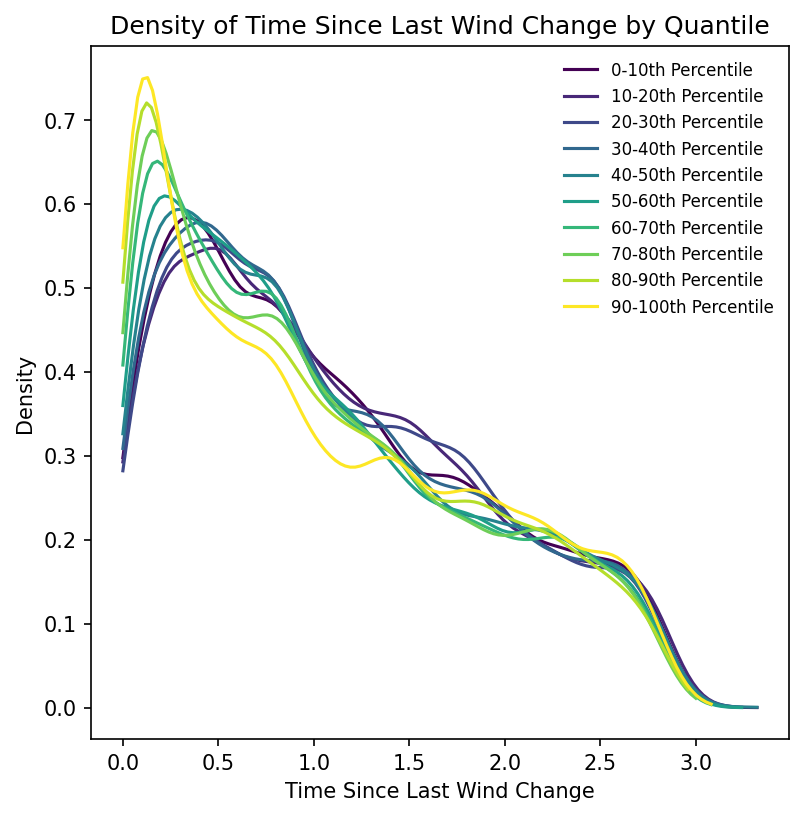

In [18]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import gaussian_kde
import matplotlib.cm as cm
# from scipy.integrate import simps 

# Sort quantiles
filtered_df.dropna(inplace=True)
quantiles = filtered_df['turn_dt_abs_quantile_per_eps'].unique()
quantiles.sort()
print(quantiles)
# Set up plot
fig, ax = plt.subplots(figsize=(6, 6), dpi=150)

# Generate distinct colors using a colormap
cmap = cm.get_cmap('viridis', len(quantiles))  # 'viridis' ensures good contrast
# cmap = cm.get_cmap('Purples', len(quantiles))  # 'viridis' ensures good contrast

# Iterate over quantiles and plot density
for i, now_qt in enumerate(quantiles):
    tmp_df = filtered_df[filtered_df['turn_dt_abs_quantile_per_eps'] == now_qt]
    
    if len(tmp_df) > 1:
        kde = gaussian_kde(tmp_df['time_since_last_wind_change'])
        

        # integrate the density to get the probability
        x_vals = np.linspace(tmp_df['time_since_last_wind_change'].min(), 
                             tmp_df['time_since_last_wind_change'].max(), 120)
        kde_vals = kde(x_vals)
        # Compute integral using Trapezoidal Rule
        integral_trapz = np.trapz(kde_vals, x_vals)
        print(f"Integral using Trapezoidal Rule: {integral_trapz:.4f}")
        # ax.plot(x_vals, kde(x_vals), color=cmap(i))
        ax.plot(x_vals, kde(x_vals), color=cmap(i), label=f'{int(now_qt*10)}-{int((now_qt+1)*10)}th Percentile')
# for i, now_qt in enumerate(quantiles):
#     ax.text(0.8, 0.9 - (i * 0.05), f'Quantile {now_qt}', 
#             color=cmap(i), transform=ax.transAxes, fontsize=8,
#             bbox=dict(facecolor='lightgray', edgecolor='lightgray', boxstyle='round,pad=0.3'))

# Add legend and labels
ax.set_xlabel("Time Since Last Wind Change")
ax.set_ylabel("Density")
ax.set_title("Density of Time Since Last Wind Change by Quantile")
ax.legend(loc='best', fontsize=8, frameon=False, facecolor='lightgray')


plt.show()